In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/ALL/MapcoLeafDetection'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
!pip install scikit-image
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Streaming output truncated to the last 5000 lines.
/content/drive/MyDrive/ALL/MapcoLeafDetection/dataset/MepcoTropicLeaf-V1/Database/Green Chireta.zip/014_25.jpg
/content/drive/MyDrive/ALL/MapcoLeafDetection/dataset/MepcoTropicLeaf-V1/Database/Green Chireta.zip/014_26.jpg
/content/drive/MyDrive/ALL/MapcoLeafDetection/dataset/MepcoTropicLeaf-V1/Database/Green Chireta.zip/014_27.jpg
/content/drive/MyDrive/ALL/MapcoLeafDetection/dataset/MepcoTropicLeaf-V1/Database/Green Chireta.zip/014_28.jpg
/content/drive/MyDrive/ALL/MapcoLeafDetection/dataset/MepcoTropicLeaf-V1/Database/Green Chireta.zip/014_29.jpg
/content/drive/MyDrive/ALL/MapcoLeafDetection/dataset/MepcoTropicLeaf-V1/Database/Green Chireta.zip/014_3.jpg
/content/drive/MyDrive/ALL/MapcoLeafDetection/dataset/MepcoTropicLeaf-V1/Database/Green Chireta.zip/014_30.jpg
/content/drive/MyDrive/ALL/MapcoLeafDetection/dataset/MepcoTropicLeaf-V1/Database/Green Chireta.zip/014_31.jpg
/content/drive/MyDrive/ALL/MapcoLeafDetection/dataset/MepcoTro

In [3]:

import tensorflow
import keras
import os
import glob
import cv2
from skimage import io
import random
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from keras.preprocessing.image import ImageDataGenerator

In [7]:
dataset_path='/content/drive/MyDrive/ALL/MapcoLeafDetection/dataset/Spinach/Database/Black Night Shade'


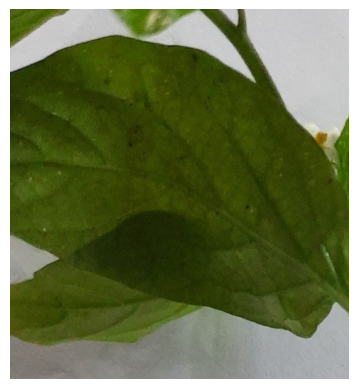

In [8]:
image_files = glob.glob(os.path.join(dataset_path, '*.jpg'))

# Check if there are any image files
if not image_files:
    print("No image files found in the dataset directory.")
else:
    # Choose a random image from the dataset
    random_image_path = random.choice(image_files)

    # Load and display the image
    image = io.imread(random_image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()


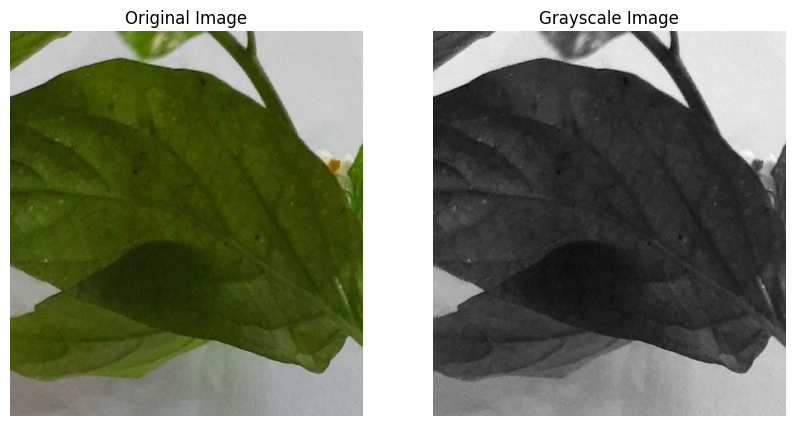

In [9]:
original_image = io.imread(random_image_path)

    # Convert the image to grayscale
grayscale_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
 # Plot the original and grayscale images side by side
plt.figure(figsize=(10, 5))

    # Original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')

plt.axis('off')

    # Grayscale image
plt.subplot(1, 2, 2)
plt.imshow(grayscale_image, cmap='gray')  # Use 'gray' colormap for grayscale images
plt.title('Grayscale Image')
plt.axis('off')
plt.show()

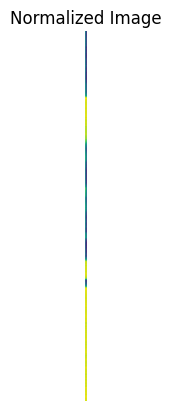

In [10]:
image_datagen = ImageDataGenerator(rescale=1./255)
image = io.imread(random_image_path)
image = image.reshape((1,) + image.shape)
normalized_image = image_datagen.flow(image).next()[0][0]
plt.subplot(1, 2, 2)
plt.imshow(normalized_image)
plt.title('Normalized Image')
plt.axis('off')
plt.show()

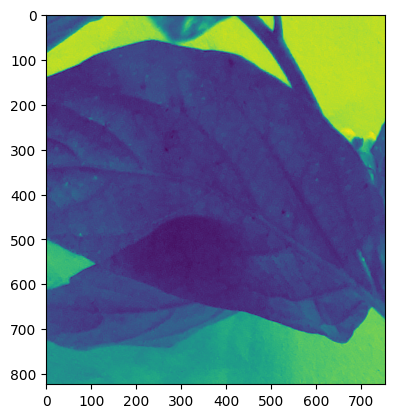

In [11]:
norm_image = (grayscale_image - np.min(grayscale_image)) / (np.max(grayscale_image) - np.min(grayscale_image))
plt.imshow(norm_image)

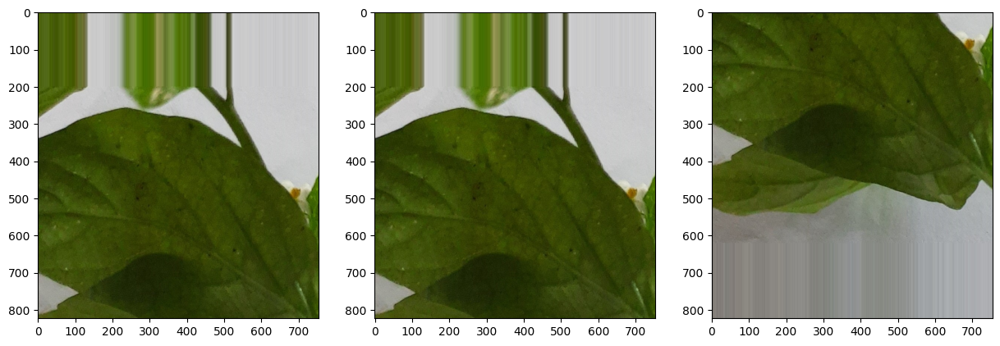

In [12]:
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
data = img_to_array(original_image)

# expand dimension to one sample
samples = expand_dims(original_image, 0)

# create image data augmentation generator
datagen = ImageDataGenerator(width_shift_range=[-200,200])

# create an iterator
it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

# generate batch of images
for i in range(3):

    # convert to unsigned integers
    original_image = next(it)[0].astype('uint8')

    # plot image
    im[i].imshow(original_image)

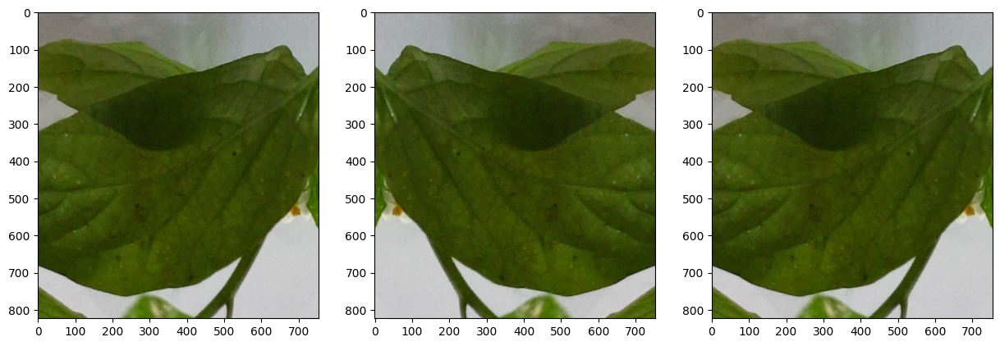

In [13]:
datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
# create an iterator
it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

# generate batch of images
for i in range(3):

    # convert to unsigned integers
    original_image = next(it)[0].astype('uint8')

    # plot image
    im[i].imshow(original_image)



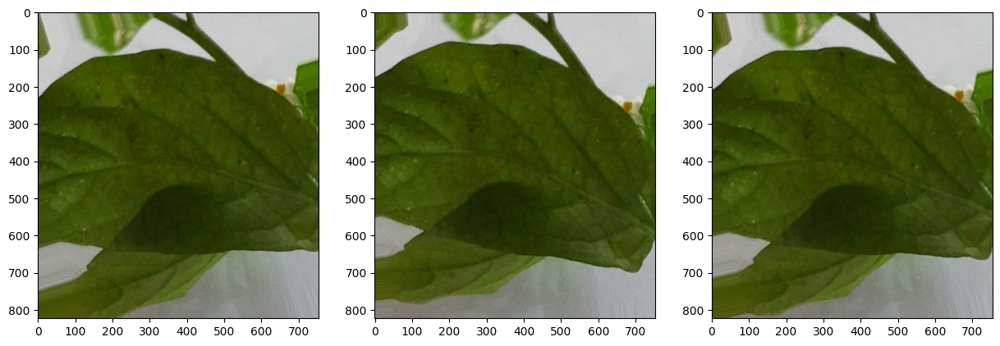

In [14]:
datagen = ImageDataGenerator(rotation_range=20, fill_mode='nearest')

# create an iterator
it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

# generate batch of images
for i in range(3):

    # convert to unsigned integers
    original_image = next(it)[0].astype('uint8')

    # plot image
    im[i].imshow(original_image)

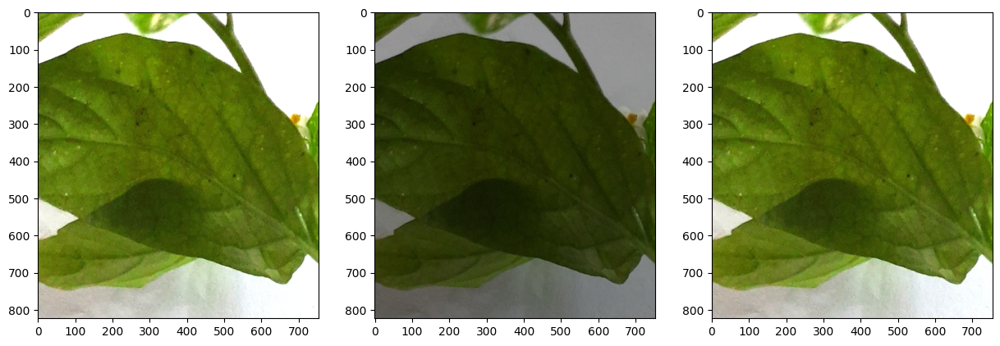

In [15]:
datagen = ImageDataGenerator(brightness_range=[0.5,2.0])
# create an iterator
it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

# generate batch of images
for i in range(3):

    # convert to unsigned integers
    original_image = next(it)[0].astype('uint8')

    # plot image
    im[i].imshow(original_image)

/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1862: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1872: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


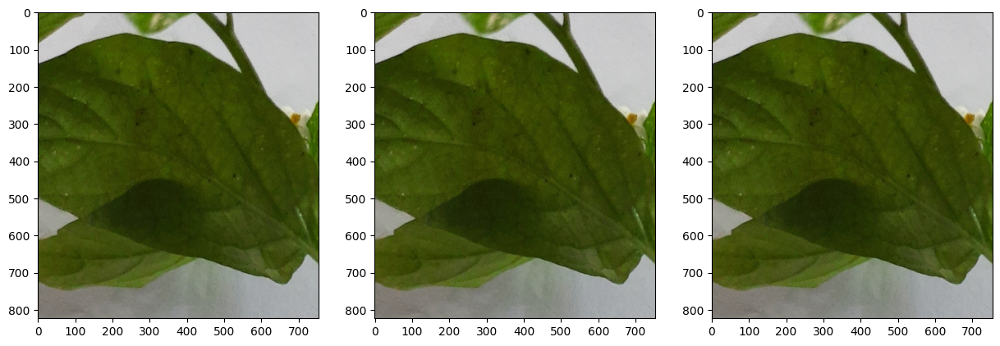

In [16]:
datagen = ImageDataGenerator(featurewise_center =True,
      featurewise_std_normalization = True)
# create an iterator
it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

# generate batch of images
for i in range(3):

    # convert to unsigned integers
    original_image = next(it)[0].astype('uint8')

    # plot image
    im[i].imshow(original_image)

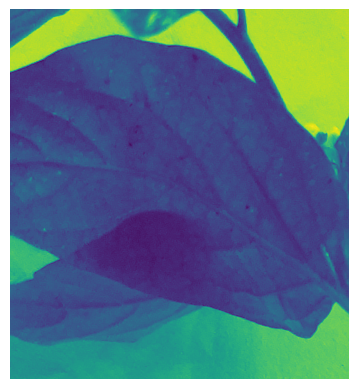

In [17]:

import cv2 as cv
img = cv.imread(random_image_path)
assert img is not None, "file could not be read, check with os.path.exists()"
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)
plt.imshow(gray)
plt.axis('off')
plt.show()

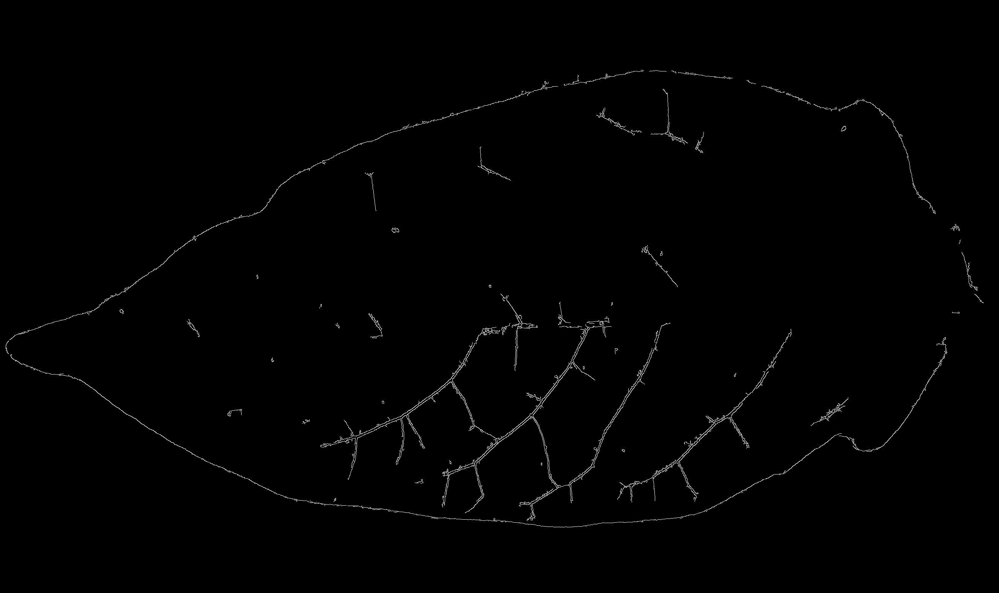

Number of Contours found = 191


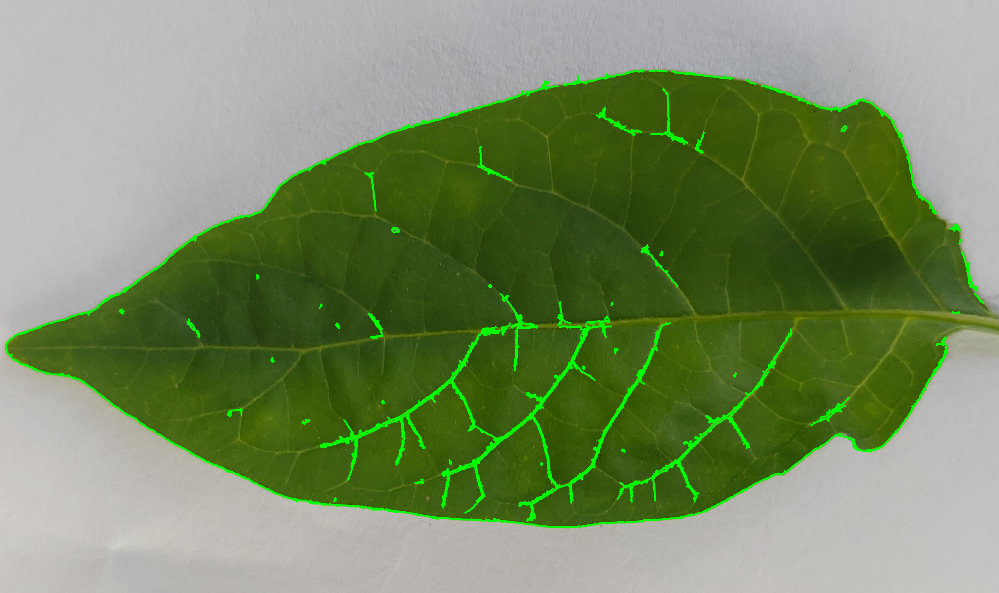

In [23]:
# Install OpenCV headless version
!pip install opencv-python-headless

# Import necessary libraries
import cv2
from google.colab.patches import cv2_imshow

# Set the image path (make sure this is the correct path to your image)
random_image_path = random.choice(image_files)  # replace with your actual image path

# Load the image
image = cv2.imread(random_image_path)

# Check if the image is loaded properly
if image is None:
    print("Error: Image not loaded correctly. Please check the file path.")
else:
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    edged = cv2.Canny(gray, 30, 200)

    contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    cv2_imshow(edged)  # Use cv2_imshow instead of cv2.imshow

    print("Number of Contours found = " + str(len(contours)))

    # Draw all contours -1 signifies drawing all contours
    cv2.drawContours(image, contours, -1, (0, 255, 0), 3)

    cv2_imshow(image)  # Use cv2_imshow instead of cv2.imshow

    cv2.waitKey(0)
    cv2.destroyAllWindows()


Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/width_shift_aug_1.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/width_shift_aug_2.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/width_shift_aug_3.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/flip_aug_1.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/flip_aug_2.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/flip_aug_3.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/rotation_aug_1.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/rotation_aug_2.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/rotation_aug_3.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/brightness_aug_1.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/brightness_aug_2.jpg
Image sav

/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1862: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1872: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/featurewise_aug_1.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/featurewise_aug_2.jpg
Image saved to /content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented/featurewise_aug_3.jpg


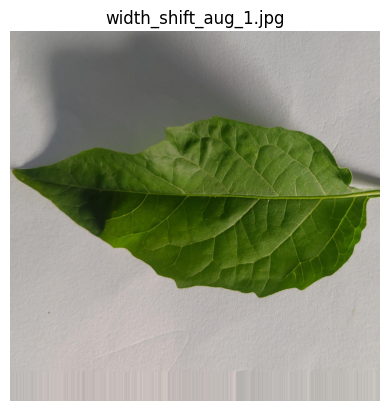

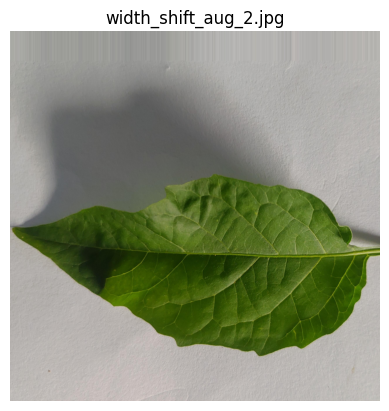

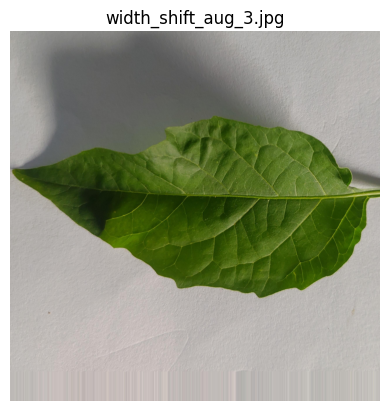

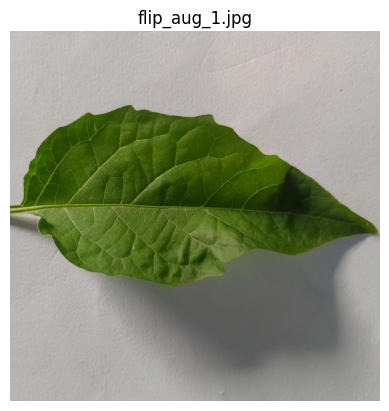

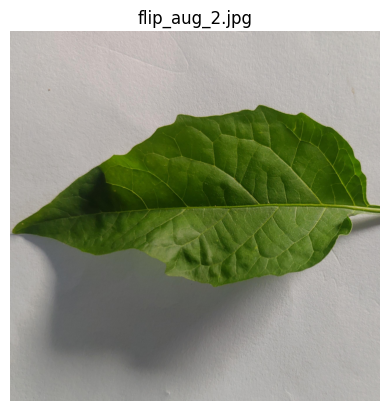

...

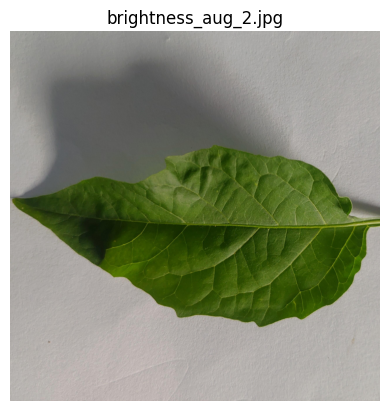

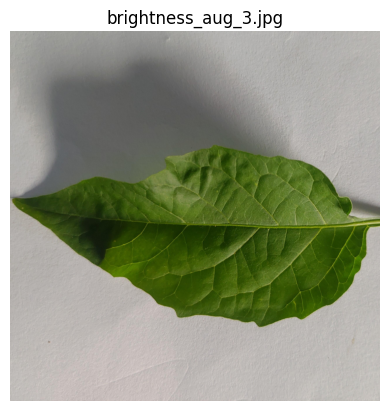

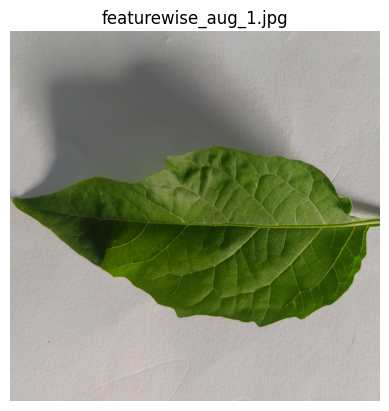

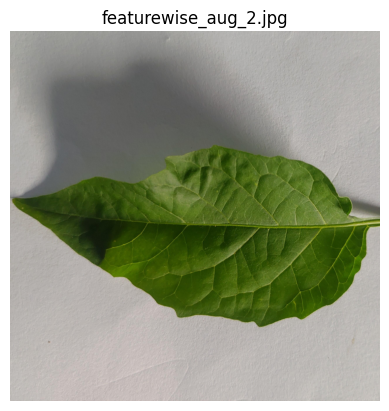

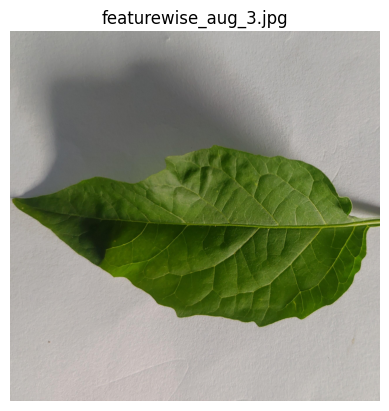

In [26]:
import os
import torch
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
from skimage import io

# Define the paths
model_save_path = "/content/drive/MyDrive/ALL/MapcoLeafDetection/plant_model1.pt"
augmented_images_save_path = "/content/drive/MyDrive/ALL/MapcoLeafDetection/Augmented"
# os.makedirs(augmented_images_save_path, exist_ok=True)

# # Save the trained model
# torch.save(model.state_dict(), model_save_path)
# print(f"Model saved to {model_save_path}")

# Function to save augmented images
def save_augmented_images(datagen, samples, num_images, save_path, prefix):
    it = datagen.flow(samples, batch_size=1)
    for i in range(num_images):
        augmented_image = next(it)[0].astype('uint8')
        file_path = os.path.join(save_path, f"{prefix}_aug_{i+1}.jpg")
        plt.imsave(file_path, augmented_image)
        print(f"Image saved to {file_path}")

# Load a random image from the dataset for augmentation
image_files = glob.glob(os.path.join(dataset_path, '*.jpg'))
random_image_path = random.choice(image_files)
image = io.imread(random_image_path)
samples = np.expand_dims(image, axis=0)

# Save augmented images with different augmentations
datagen = ImageDataGenerator(width_shift_range=[-200, 200])
save_augmented_images(datagen, samples, 3, augmented_images_save_path, "width_shift")

datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
save_augmented_images(datagen, samples, 3, augmented_images_save_path, "flip")

datagen = ImageDataGenerator(rotation_range=20, fill_mode='nearest')
save_augmented_images(datagen, samples, 3, augmented_images_save_path, "rotation")

datagen = ImageDataGenerator(brightness_range=[0.5, 2.0])
save_augmented_images(datagen, samples, 3, augmented_images_save_path, "brightness")

datagen = ImageDataGenerator(featurewise_center=True, featurewise_std_normalization=True)
save_augmented_images(datagen, samples, 3, augmented_images_save_path, "featurewise")

# Display saved images
for dirname, _, filenames in os.walk(augmented_images_save_path):
    for filename in filenames:
        img_path = os.path.join(dirname, filename)
        img = plt.imread(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(filename)
        plt.show()
